In [1]:
from matplotlib import pyplot as plt
from ptypy import io
import os
import numpy as np
from scipy import ndimage as ndi
%matplotlib widget

WARNING ptypy - Message Passaging for Python (mpi4py) not found.
    CPU-parallelization disabled.
    Install python-mpi4py via the package repositories or with `pip install --user mpi4py`


In [2]:
data_path = "./lab_microradiograph_data.h5"

# Effective pixel size (result of x2 optical magnification and 1.091 geometric magnification)
psize = 2.979e-6

In [3]:
# Load data
data = io.h5read(data_path)

In [57]:
dark = 99.

# Raw frames
frames = data['data'][:, :, :2048] - dark

# Existing flat estimate
flat = data['flat'][:, :2048] - dark

# Frame shape
fsh = frames[0].shape

In [32]:
# These positions seem quite off...
pos = data['pos']  # actually an array of the relative movements made
positions = np.empty(np.shape(pos))
for i in range(np.shape(positions)[0]):
    positions[i, :] = np.sum(pos[:i, :], axis=0)
positions *= 330  # some scaling stuff
positions = np.round(positions).astype(int)
positions = positions[:,::-1]

In [17]:
def mad(a):
    """
    Median absolute deviation: estimation of the standard deviation robust to outliers.
    """
    return np.median(np.abs(a - np.median(a))) * 1.4826

def imsh(a, p=.05, **kwargs):
    return plt.imshow(a, vmin=np.percentile(a,100*p), vmax=np.percentile(a,100*(1-p)))

In [7]:
# Generate mask to eliminate bad pixels
mask_threshold = 2.5*mad(flat)
mask_medfilt_size = 20
mf = ndi.median_filter(flat, mask_medfilt_size)
mask = np.abs(flat-mf) < mask_threshold
masks = [mask for i in range(len(positions))]

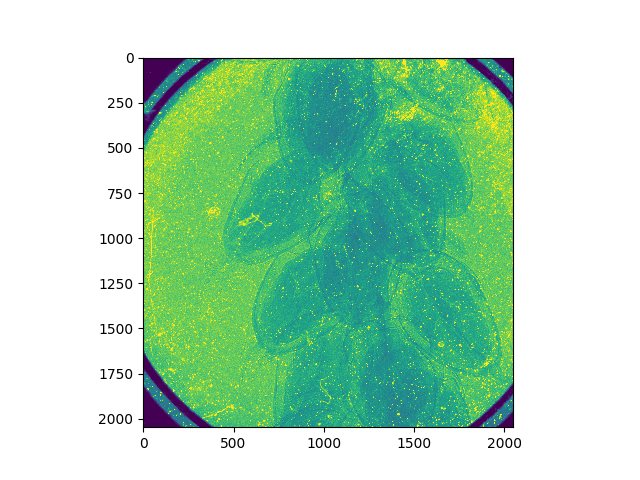

In [8]:
f0 = frames[0]
plt.imshow(f0, vmin=np.percentile(f0,2), vmax=np.percentile(f0, 98))

In [58]:
# Work on downsampled data
f1 = ndi.zoom(frames, zoom=(1, .25, .25))
f0 = ndi.zoom(flat, zoom=(.25, .25))
fm = ndi.zoom(mask*1., zoom=(.25, .25))>.8

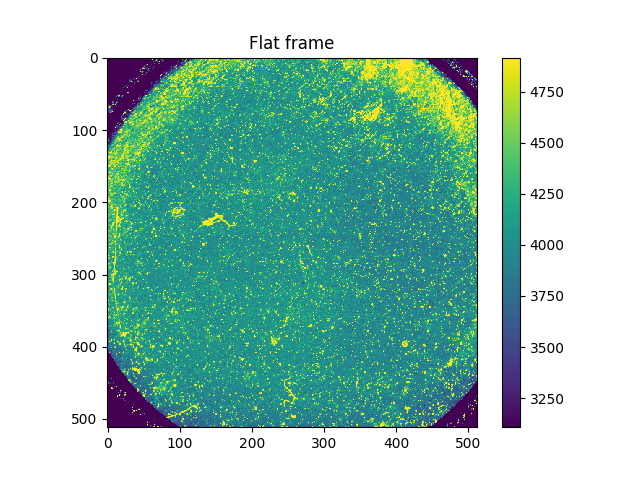

In [59]:
plt.close('all')
imsh(f0)
ax = plt.gca()
ax.set_title('Flat frame')
plt.colorbar()

In [60]:
%run stitching.py
%run ccshift.py

In [61]:
img, new_flat, new_positions = merge_image_stack(frames=f1, positions=None, flat=f0, mask=fm, refine_flat=False, max_iter=5, max_shift=20)

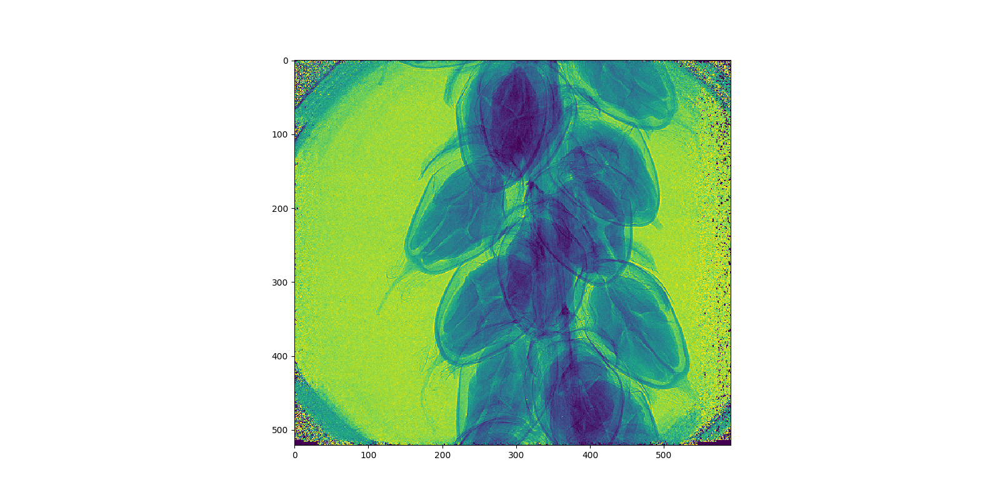

In [79]:
plt.figure(figsize=(16,8))
imsh(img, .01)

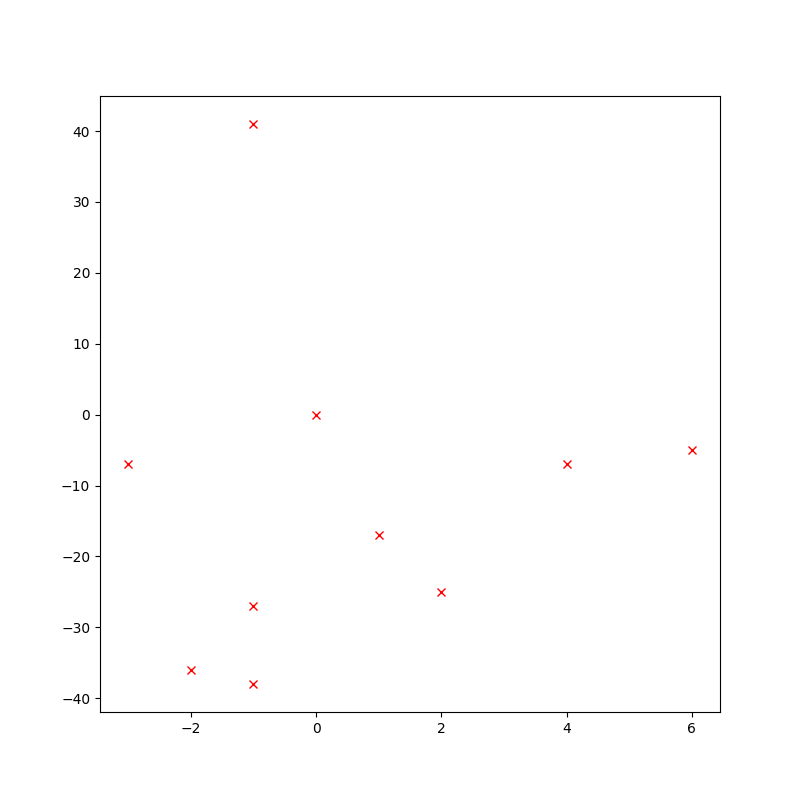

In [63]:
plt.close('all')
plt.figure(figsize=(8,8))
plt.plot(new_positions[:,0], new_positions[:,1], 'rx')

In [77]:
# Save intermediate result
io.h5write('stalk_down4_data_and_result.h5', frames=f1, flat=f0, mask=fm, positions=new_positions, merged=img)

In [64]:
# Work on less downsampled data
g1 = ndi.zoom(frames, zoom=(1, .5, .5))
g0 = ndi.zoom(flat, zoom=(.5, .5))
gm = ndi.zoom(mask*1., zoom=(.5, .5))>.8
start_pos = 2*new_positions
img1, new_flat1, new_positions1 = merge_image_stack(frames=g1, positions=start_pos, flat=g0, mask=gm, refine_flat=False, max_iter=5, max_shift=20)

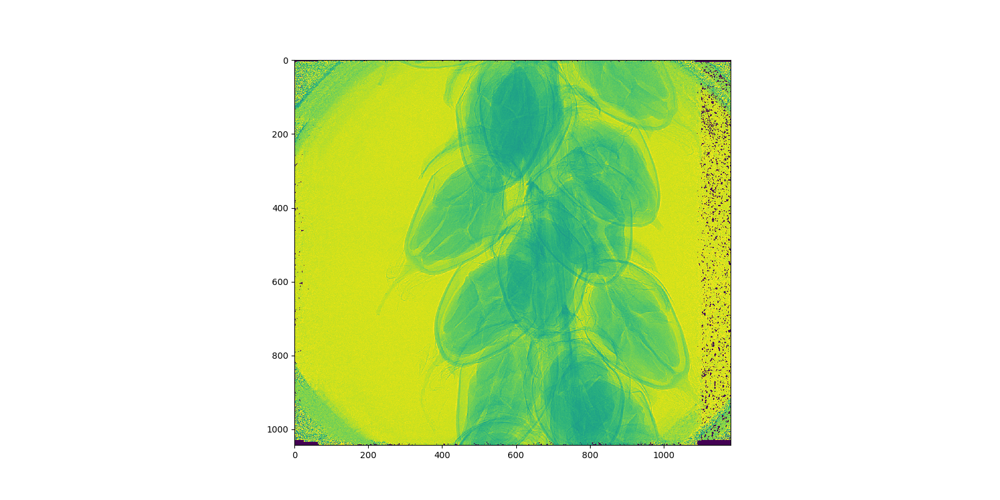

In [70]:
plt.figure(figsize=(16,8))
imsh(img1, p=.008)

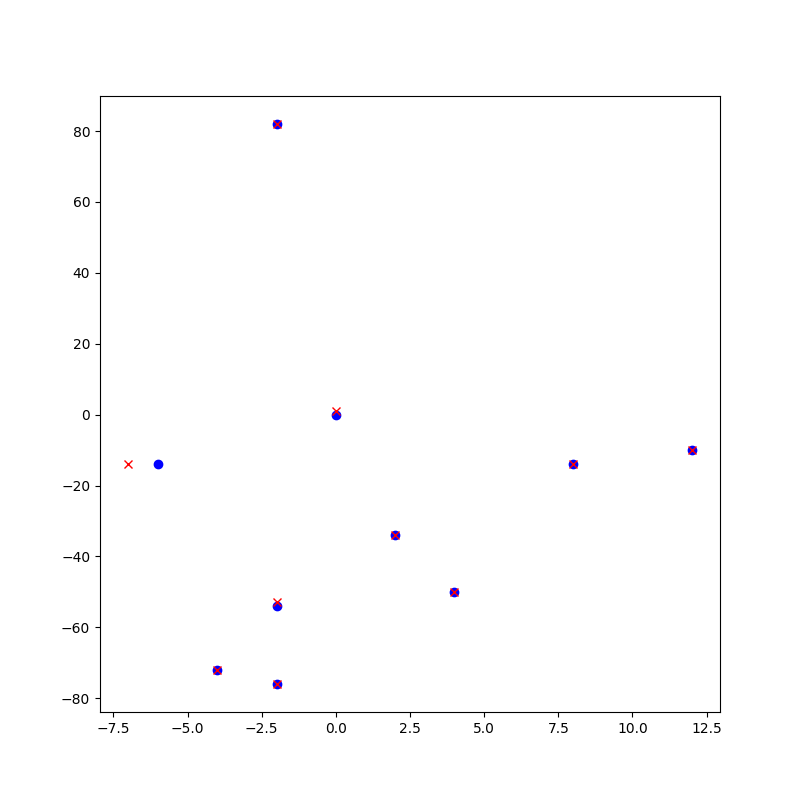

In [71]:
plt.close('all')
plt.figure(figsize=(8,8))
plt.plot(start_pos[:,0], start_pos[:,1], 'bo')
plt.plot(new_positions1[:,0], new_positions1[:,1], 'rx')

In [72]:
# Original resolution
h1 = frames.copy()
h0 = flat.copy()
hm = mask.copy()
start_pos1 = 2*new_positions1
img2, new_flat2, new_positions2 = merge_image_stack(frames=h1, positions=start_pos1, flat=h0, mask=hm, refine_flat=False, max_iter=5, max_shift=20)

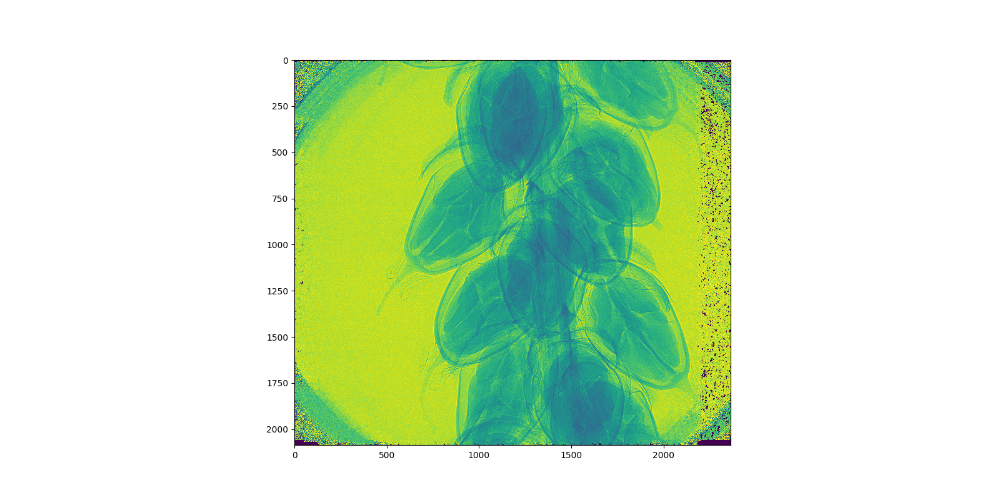

In [75]:
plt.figure(figsize=(16,8))
imsh(img2, p=.01)

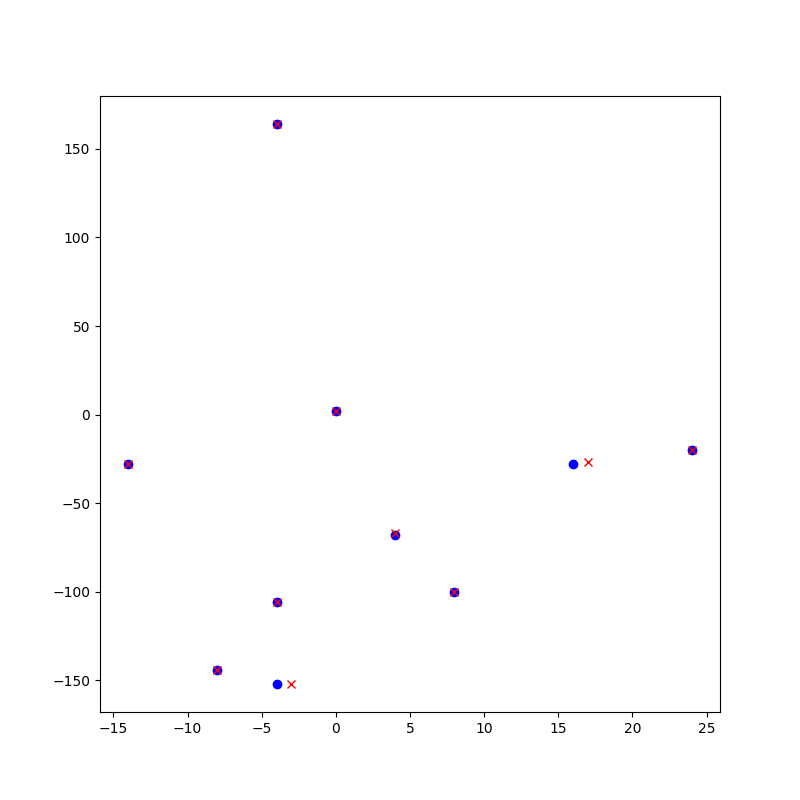

In [76]:
plt.figure(figsize=(8,8))
plt.plot(start_pos1[:,0], start_pos1[:,1], 'bo')
plt.plot(new_positions2[:,0], new_positions2[:,1], 'rx')